# TP2: Análisis Exploratorio

Autores: Ana Paula Cobresí, Gonzalo Angaut, Javier Albiero y Octavio Santi.

## Introducción

Primer trabajo práctico de la mentoría sobre "Predicciones en el Espacio: ¿Cuántos satélites y desechos podremos tener?", donde se busca comprender el conjunto de datos y familiarizarse con las variables disponibles en los diferentes archivos: número de satélites, tipo de misión, vida útil estimada, tipo de órbita, país o entidad responsable, fecha de lanzamiento, entre otros.

Para ello comenzaremos realizando varias visualizaciones de los datos e inspeccionando las relaciones entre distintas variables en cada dataset.

Los archivos con los datos son: [satellites.json](https://github.com/EnzoRg/space_debris/blob/main/data/raw/satellites.json), [debris.json](https://github.com/EnzoRg/space_debris/blob/main/data/raw/debris.json), [rockets.json](https://github.com/EnzoRg/space_debris/blob/main/data/raw/rockets.json) y [unknown.json](https://github.com/EnzoRg/space_debris/blob/main/data/raw/unknown.json), que contienen la informacion de satélites, debris espaciales, cohetes de lanzamiento y objetos no identicados, respectivamente. Es importante notar que todos tienen las mismas columnas pero sobre distintos objetos.

Además, existe una base de datos proporcionada por la "Union of Concerned Scientists" que ayuda a complementar los datos anteriores. Esta puede encontrarse en el archivo: [ucs-satellite-database.xlsx](https://github.com/EnzoRg/space_debris/blob/main/data/raw/ucs-satellite-database.xlsx).

## Inspección de los datos

Importamos las librerías necesarias para el análisis y visualización de los datos.

In [40]:
#%pip install openpyxl # Sólo para Colab, Anaconda lo provee localmente
#%pip install sweetviz
#%pip install ydata_profiling

import os
import pandas as pd
import numpy as np
import seaborn as sns
import sweetviz as sv
import matplotlib.pyplot as plt

from enum import Enum
from pandas import DataFrame, Series
from typing import Sequence
from ydata_profiling import ProfileReport

pd.options.mode.copy_on_write = True
pd.options.display.max_columns = None

%matplotlib inline

Comencemos leyendo los archivos y mostrando las primeras filas para visualizar la forma de los datos.

In [41]:
file_base_path = "https://raw.githubusercontent.com/EnzoRg/space_debris/refs/heads/main/data/raw"
#file_base_path = "../../space_debris/data/raw" # acceso local

satellites_df = pd.read_json(f"{file_base_path}/satellites.json")
debris_df = pd.read_json(f"{file_base_path}/debris.json")
rockets_df = pd.read_json(f"{file_base_path}/rockets.json")
unknown_df = pd.read_json(f"{file_base_path}/unknown.json")
extra_data_df = pd.read_excel(f"{file_base_path}/ucs-satellite-database.xlsx")

# Veamos por ejemplo las primeras filas del df de satélites
satellites_df[:3]

,INTLDES,NORAD_CAT_ID,OBJECT_TYPE,SATNAME,COUNTRY,LAUNCH,SITE,DECAY,PERIOD,INCLINATION,APOGEE,PERIGEE,COMMENT,COMMENTCODE,RCSVALUE,RCS_SIZE,FILE,LAUNCH_YEAR,LAUNCH_NUM,LAUNCH_PIECE,CURRENT,OBJECT_NAME,OBJECT_ID,OBJECT_NUMBER
0,1958-001A,4,PAYLOAD,EXPLORER 1,US,1958-02-01,AFETR,1970-03-31,88.48,33.15,215.0,183.0,None,NaN,0,None,1,1958,1,A,Y,EXPLORER 1,1958-001A,4
1,1958-003A,6,PAYLOAD,EXPLORER 3,US,1958-03-26,AFETR,1958-06-28,103.60,33.50,1739.0,117.0,None,5.0,0,None,1,1958,3,A,Y,EXPLORER 3,1958-003A,6
2,1958-004B,8,PAYLOAD,SPUTNIK 3,CIS,1958-05-15,TTMTR,1960-04-06,88.43,65.06,255.0,139.0,None,NaN,0,LARGE,1,1958,4,B,Y,SPUTNIK 3,1958-004B,8


In [42]:
# O las primeras columnas del debris
debris_df[:3]

,INTLDES,NORAD_CAT_ID,OBJECT_TYPE,SATNAME,COUNTRY,LAUNCH,SITE,DECAY,PERIOD,INCLINATION,APOGEE,PERIGEE,COMMENT,COMMENTCODE,RCSVALUE,RCS_SIZE,FILE,LAUNCH_YEAR,LAUNCH_NUM,LAUNCH_PIECE,CURRENT,OBJECT_NAME,OBJECT_ID,OBJECT_NUMBER
0,1960-003C,33,DEBRIS,THOR ABLESTAR DEB,US,1960-04-13,AFETR,1960-07-17,93.59,51.29,615.0,285.0,None,NaN,0,None,1,1960,3,C,Y,THOR ABLESTAR DEB,1960-003C,33
1,1960-005D,37,DEBRIS,SPUTNIK 4 DEB,CIS,1960-05-15,TTMTR,1961-06-30,92.92,64.89,552.0,282.0,None,NaN,0,None,1,1960,5,D,Y,SPUTNIK 4 DEB,1960-005D,37
2,1960-005E,38,DEBRIS,SPUTNIK 4 DEB,CIS,1960-05-15,TTMTR,1960-08-20,90.63,64.89,328.0,282.0,None,NaN,0,None,1,1960,5,E,Y,SPUTNIK 4 DEB,1960-005E,38


### Unificación de los _datasets_

Como todos tienen la misma estructura, y el tipo de objeto puede saberse desde 'OBJECT_TYPE', podemos concatenarlos en un solo DataFrame.

In [4]:
# Veamos que cada archivo tenga su propio OBJECT_TYPE
print(satellites_df.OBJECT_TYPE.unique())
print(debris_df.OBJECT_TYPE.unique())
print(rockets_df.OBJECT_TYPE.unique())
print(unknown_df.OBJECT_TYPE.unique())

['PAYLOAD']
['DEBRIS']
['ROCKET BODY']
['UNKNOWN']


In [5]:
# Los concatenamos en un solo DataFrame
space_objects_df = pd.concat([satellites_df, debris_df, rockets_df, unknown_df], ignore_index=True)

# Vemos el dataframe
space_objects_df.sample(5)

,INTLDES,NORAD_CAT_ID,OBJECT_TYPE,SATNAME,COUNTRY,LAUNCH,SITE,DECAY,PERIOD,INCLINATION,APOGEE,PERIGEE,COMMENT,COMMENTCODE,RCSVALUE,RCS_SIZE,FILE,LAUNCH_YEAR,LAUNCH_NUM,LAUNCH_PIECE,CURRENT,OBJECT_NAME,OBJECT_ID,OBJECT_NUMBER
50794,1982-055BG,18507,DEBRIS,COSMOS 1375 DEB,CIS,1982-06-06,PKMTR,None,105.40,65.83,1053.0,973.0,None,NaN,0,MEDIUM,9106,1982,55,BG,Y,COSMOS 1375 DEB,1982-055BG,18507
8043,2020-073AC,46696,PAYLOAD,STARLINK-1795,US,2020-10-18,AFETR,None,95.59,53.05,548.0,546.0,None,NaN,0,LARGE,9097,2020,73,AC,Y,STARLINK-1795,2020-073AC,46696
30590,2006-026QG,33200,DEBRIS,COSMOS 2421 DEB,CIS,2006-06-25,TTMTR,2010-05-21,88.38,65.00,204.0,185.0,None,NaN,0,SMALL,7337,2006,26,QG,Y,COSMOS 2421 DEB,2006-026QG,33200
25245,1986-040C,16747,DEBRIS,COSMOS 1746 DEB,CIS,1986-05-28,PKMTR,1986-06-08,88.15,82.30,190.0,176.0,None,NaN,0,LARGE,1,1986,40,C,Y,COSMOS 1746 DEB,1986-040C,16747
31850,1999-025AYB,30889,DEBRIS,FENGYUN 1C DEB,PRC,1999-05-10,TSC,2014-11-03,91.05,98.67,347.0,305.0,None,NaN,0,SMALL,7337,1999,25,AYB,Y,FENGYUN 1C DEB,1999-025AYB,30889


In [6]:
# Veamos que el tamaño del nuevo df es igual a la suma de los anteriores
satellites_df.shape[0]+debris_df.shape[0]+rockets_df.shape[0]+unknown_df.shape[0] == space_objects_df.shape[0]

True

## Filtrado de los datos

### Relaciones entre objeto y tipo de órbita

Podemos ahora empezar a guiarnos con la pregunta: "¿Cuál es la relación entre el tamaño del objeto y su tipo de órbita?". Para esto, es necesario darnos cuenta que el tamaño estimado del objeto viene descripto por la columna "RCS_SIZE" (sea el objeto que sea). Por otro lado, la clase de órbita aparece en el otro archivo ([ucs-satellite-database.xlsx](https://github.com/EnzoRg/space_debris/blob/main/data/raw/ucs-satellite-database.xlsx)), donde aparecen tanto la columna "Class of Orbit" y "Type of Orbit". Veamos este archivo.

In [7]:
extra_data_df[:3]

,"Name of Satellite, Alternate Names",Current Official Name of Satellite,Country/Org of UN Registry,Country of Operator/Owner,Operator/Owner,Users,Purpose,Detailed Purpose,Class of Orbit,Type of Orbit,Longitude of GEO (degrees),Perigee (km),Apogee (km),Eccentricity,Inclination (degrees),Period (minutes),Launch Mass (kg.),Dry Mass (kg.),Power (watts),Date of Launch,Expected Lifetime (yrs.),Contractor,Country of Contractor,Launch Site,Launch Vehicle,COSPAR Number,NORAD Number,Comments,Unnamed: 28,Source Used for Orbital Data,Source,Source.1,Source.2,Source.3,Source.4,Source.5,Source.6,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67
0,1HOPSAT-TD (1st-generation High Optical Perfor...,1HOPSAT-TD,NR,USA,Hera Systems,Commercial,Earth Observation,Infrared Imaging,LEO,Non-Polar Inclined,0.0,566.0,576.0,0.00151,36.90,96.08,22.0,NaN,NaN,2019-12-11 00:00:00,0.5,Hera Systems,USA,Satish Dhawan Space Centre,PSLV,2019-089H,44859,Pathfinder for planned earth observation const...,NaN,JMSatcat/3_20,https://spaceflightnow.com/2019/12/11/indias-5...,https://www.herasys.com/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AAC AIS-Sat1 (Kelpie 1),AAC AIS-Sat1 (Kelpie 1),United Kingdom,United Kingdom,AAC Clyde Space,Commercial,Earth Observation,Automatic Identification System (AIS),LEO,Sun-Synchronous,0.0,637.0,654.0,0.00151,98.00,95.00,4.0,4,NaN,2023-01-03 00:00:00,NaN,AAC Clyde Space,Sweden/UK/USA/Netherlands,Cape Canaveral,Falcon 9,2023-001DC,55107,Provide AIS information to Orbcomm.,NaN,JMSatcat/9_23,https://www.aac-clyde.space/articles/aac-clyde...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Aalto-1,Aalto-1,Finland,Finland,Aalto University,Civil,Technology Development,NaN,LEO,Sun-Synchronous,0.0,497.0,517.0,0.00145,97.45,94.70,4.5,NaN,4.5,2017-06-23 00:00:00,2.0,Aalto University,Finland,Satish Dhawan Space Centre,PSLV,2017-036L,42775,Technology development and education.,NaN,JMSatcat/10_17,https://directory.eoportal.org/web/eoportal/sa...,NaN,http://www.planet4589.org/space/log/satcat.txt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Por lo tanto, un primer paso sería combinar los dataframes. Para esto, notar que en el df de space objects tenemos la columna "NORAD_CAT_ID" mientras que en el extra la columna "NORAD Number", y ambas contien el identificador único asignado por NORAD.

In [8]:
space_objects_df['NORAD_CAT_ID'].sample(5)

46814    39665
21844     4972
26162    21710
45274    40785
17313    51132
Name: NORAD_CAT_ID, dtype: int64

In [9]:
extra_data_df['NORAD Number'].sample(5)

5963    53560
3875    47574
1481    55019
5453    52697
3162    44949
Name: NORAD Number, dtype: int64

Antes de unir los dataframes (o agregar las columnas relevantes de extra_data a satellites, etc) veamos que los identificadores son realmente únicos.

In [10]:
print("Duplicados en space objects: ", space_objects_df['NORAD_CAT_ID'].duplicated().sum())
print("Duplicados en extra_data: ", extra_data_df['NORAD Number'].duplicated().sum())

Duplicados en space objects:  0
Duplicados en extra_data:  9


Notemos que el único que contiene identificadores duplicados es `extra_data_df`. Por ende, antes de unirlos, exploremos como son estos datos.

In [11]:
# Cantidad de filas totalmente duplicadas (incluyendo NORAD Number y demás)
exact_duplicates = extra_data_df.duplicated()
exact_duplicates.sum()

np.int64(7)

Hay 7 filas que están completamente duplicadas. Por lo tanto, podemos eliminar los duplicados y quedarnos unicamente con 1 de esos.

In [12]:
extra_data_clean_df = extra_data_df.drop_duplicates()
extra_data_clean_df['NORAD Number'].duplicated().sum()

np.int64(2)

Quedan 2 filas que tienen el mismo 'NORAD Number' pero no estan completamente duplicados. Veamos estas.

In [13]:
# Veamos los NORAD Numbers que siguen estando duplicados en extra_data_clean
remaining_dupes = extra_data_clean_df['NORAD Number'][extra_data_clean_df['NORAD Number'].duplicated()].unique()

# Vemos los nombres de los satelites en esos NORAD Numbers
space_obj_names_df = space_objects_df[space_objects_df['NORAD_CAT_ID'].isin(remaining_dupes)][['NORAD_CAT_ID', 'SATNAME']]
print(space_obj_names_df)

# Vemos los nombres de los extra_data_clean en los duplicados
extra_dupes_df = extra_data_clean_df[extra_data_clean_df['NORAD Number'].isin(remaining_dupes)][
    ['NORAD Number', 'Name of Satellite, Alternate Names']
]
print(extra_dupes_df)

       NORAD_CAT_ID        SATNAME
11757         54766  STARLINK-5471
11826         55455  STARLINK-5680
      NORAD Number Name of Satellite, Alternate Names
6621         54766                     Starlink-5471 
6622         54766                     Starlink-5472 
6744         55455      Starlink-5636                
6787         55455      Starlink-5680                


Acá podemos ver que hay un nombre en "Name of Satellite, Alternate Names" que corresponde con el nombre en "SATNAME" mientras que el otro no, por lo tanto, podemos guardar ese

In [14]:
# Creamos un diccionario de NORAD: nombre correcto
norad_correct_names = {
    54766: 'Starlink-5471',
    55455: 'Starlink-5680',
}

def keep_if_name_matches(row: Series) -> bool:
    """
    Función para filtrar las filas correctas
    """
    norad = row['NORAD Number']
    name = str(row['Name of Satellite, Alternate Names']).strip()

    # Si la fila tiene NORAD que aparece duplicado
    if norad in norad_correct_names:
        # Devolvemos el nombre correcto
        return name == norad_correct_names[norad]

    return True  # no es un NORAD conflictivo, lo dejamos

# Aplicamos el filtro
final_extra_data_df = extra_data_clean_df[extra_data_clean_df.apply(keep_if_name_matches, axis=1)]

# Chequeamos que ahora no haya duplicados en el final_extra_data
print("Duplicados en final_extra_data: ", final_extra_data_df['NORAD Number'].duplicated().sum())

Duplicados en final_extra_data:  0


Ahora que ya tenemos el _dataframe_ de datos extras sin duplicados, podemos hacer el merge tranquilamente.

A los fines del merge, se van a considerar las columnas:
1. 'NORAD Number': Con esta columna identificamos de forma única al objeto.
2. 'Class of Orbit': Describe la categoría orbital (LEO, MEO, GEO, etc.), lo cual es esencial para analizar la distribución espacial y el comportamiento orbital.
3. 'Type of Orbit': Especifica el tipo dentro de la clase (por ejemplo, Sun-Synchronous, Geostationary) y permite un análisis fino de patrones y riesgos según trayectorias.
4. 'Purpose': Permite distinguir sus usos. Es útil para detectar correlaciones entre el propósito y otras variables.
5. 'Expected Lifetime (yrs.)': Indica la duración estimada del satélite. Es clave para estimar riesgos de generación de basura espacial y para análisis de sostenibilidad.
6. 'Country of Operator/Owner': Permite asociar objetos a países actuales (no sólo de registro), importante para estudios geopolíticos y rankings por país.
7. 'Users': Agrupa los tipos de usuarios (ej. Civil, Commercial, Military, etc.). Complementa el análisis de "Purpose" para estudiar destinatarios de la tecnología satelital.
8. 'Launch Mass (kg.)': Informa sobre el tamaño/masa de los satélites.
<br>
Las otras columnas, en este momento, no parecieran aportar información relevante para los analisis que se pretenden realizar, o tienen muy pocos valores (por lo tanto, existen muchas filas sin valores)

In [15]:
# Elegimos las columnas relevantes
# TODO Por conveniencia deberíamos renombrar las columnas para que no contengan espacios
relevant_cols = ['NORAD Number', 'Class of Orbit', 'Type of Orbit','Purpose','Expected Lifetime (yrs.)','Country of Operator/Owner','Users', 'Launch Mass (kg.)'] # agregar más si es necesario
final_extra_data_small_df = final_extra_data_df[relevant_cols].rename(columns={
    'NORAD Number': 'NORAD_NUMBER',
    'Class of Orbit': 'CLASS_OF_ORBIT',
    'Type of Orbit': 'TYPE_OF_ORBIT',
    'Purpose': 'PURPOSE',
    'Expected Lifetime (yrs.)': 'EXPECTED_LIFETIME_YRS',
    'Country of Operator/Owner': 'COUNTRY_OF_OPERATOR_OWNER',
    'Users': 'USERS',
    'Launch Mass (kg.)': 'LAUNCH_MASS_KG'
})

space_objects_full_df = space_objects_df.merge(
    final_extra_data_small_df,
    how='left',
    left_on='NORAD_CAT_ID',
    right_on='NORAD_NUMBER'
)

#space_objects_full_df.sample(5)
space_objects_full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63521 entries, 0 to 63520
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   INTLDES                    63521 non-null  object 
 1   NORAD_CAT_ID               63521 non-null  int64  
 2   OBJECT_TYPE                63521 non-null  object 
 3   SATNAME                    63521 non-null  object 
 4   COUNTRY                    63521 non-null  object 
 5   LAUNCH                     63521 non-null  object 
 6   SITE                       63521 non-null  object 
 7   DECAY                      33442 non-null  object 
 8   PERIOD                     62548 non-null  float64
 9   INCLINATION                62548 non-null  float64
 10  APOGEE                     62548 non-null  float64
 11  PERIGEE                    62548 non-null  float64
 12  COMMENT                    946 non-null    object 
 13  COMMENTCODE                3553 non-null   flo

In [16]:
# Veamos que no se agregaron datos de más, solamente las columnas
print("Tamaño del original: ", space_objects_df.shape)
print("Tamaño del merged: ", space_objects_full_df.shape)

Tamaño del original:  (63521, 24)
Tamaño del merged:  (63521, 32)


In [17]:
# Notemos que los datos extra casi siempre son sólo para los satélites (capaz podriamos
# haber agregado la info extra sólo a satellites NORADs del UCS)
norads_extra = set(final_extra_data_df['NORAD Number'])

# NORADs de cada dataset
norads_sat = set(satellites_df['NORAD_CAT_ID'])
norads_debris = set(debris_df['NORAD_CAT_ID'])
norads_rockets = set(rockets_df['NORAD_CAT_ID'])
norads_unknown = set(unknown_df['NORAD_CAT_ID'])

print("NORADs en UCS:", len(norads_extra))
print("Coincidencias con satellites:", len(norads_extra & norads_sat))
print("Coincidencias con debris:", len(norads_extra & norads_debris))
print("Coincidencias con rockets:", len(norads_extra & norads_rockets))
print("Coincidencias con unknown:", len(norads_extra & norads_unknown))

NORADs en UCS: 7551
Coincidencias con satellites: 7369
Coincidencias con debris: 15
Coincidencias con rockets: 7
Coincidencias con unknown: 160


Notemos que hay muy pocos datos agregados, por lo que decidimos seguir utilizando el dataframe space_objects. Sin embargo, para trabajos futuros pueden ser útil los datos agregados para hacer una exploración e imputar otros datos.

## Reporte exploratorio de los datos

### Reporte ydata_profiling

In [18]:
REPORT_FILE = "TP2_ReporteExploratorioDeDatos.html"

profile = ProfileReport(space_objects_full_df, title="Reporte exploratorio de los datos")
profile.to_notebook_iframe()
profile.to_file(REPORT_FILE)

# Si estamos en Colab permitimos descarga del reporte desde la VM a la PC local
#
# Nota: Comentar el código de abajo si no se quiere que Colab descargue el reporte
#       en local, pero se aclara que es más fácil su análisis fuera de esta notebook
#       abriendo el archivo descargado con cualquier navegador.
if 'COLAB_GPU' in os.environ:
    from google.colab import files
    files.download(REPORT_FILE)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 32/32 [00:07<00:00,  4.04it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Reporte Sweetviz

In [19]:
# TODO
# Ver ejemplos de uso acá:
# https://colab.research.google.com/drive/1-md6YEwcVGWVnQWTBirQSYQYgdNoeSWg?usp=sharing#scrollTo=83_s70ZqD3mM

#analyze_report = sv.analyze([space_objects_full_df, "Completo"])
#analyze_report.show_notebook(w=900, h=450, scale=0.8)

## Curación de datos

En el primer paso vamos a remover algunas columnas que no consideremos relevantes como así también convertir los datos a un mismo formato estándar.

In [20]:
# Notemos que:
space_objects_full_df['RCSVALUE'].describe()

count    63521.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: RCSVALUE, dtype: float64

In [21]:
variables_to_remove = [
    'INTLDES',
    'NORAD_CAT_ID',
    'OBJECT_NUMBER',
    'OBJECT_ID',
    'OBJECT_NAME',
    'SATNAME',
    'NORAD_NUMBER',
    'FILE',
    'LAUNCH_NUM',
    'LAUNCH_PIECE',
    'COMMENT',
    'COMMENTCODE',
    'SITE',
    'OBJECT_TYPE',
    #'CLASS_OF_ORBIT',
    'TYPE_OF_ORBIT',
    'RCSVALUE', # Vale 0 para todos los datos!
    'LAUNCH', # Ya tenemos LAUNCH_YEAR
    "USERS"
]

clean_df = space_objects_full_df.drop(columns=variables_to_remove)
clean_df.sample()
clean_df.info()

# Normalizacion de la informacion 

# Convertimos fechas
# clean_df['LAUNCH'] = pd.to_datetime(clean_df['LAUNCH'], errors='coerce')
clean_df['DECAY'] = pd.to_datetime(clean_df['DECAY'], errors='coerce')
# Nos quedamos únicamente con el año
clean_df['DECAY_YEAR'] = clean_df['DECAY'].dt.year.astype('Int64')
clean_df = clean_df.drop(columns=['DECAY'])
# Creamos una nueva columna que nos diga si está activo o no
clean_df['CURRENT'] = clean_df['DECAY_YEAR'].isna()

# Llenamos con UNKNOWN aquellos que tengan tamaños desconocidos
clean_df['RCS_SIZE'] = clean_df['RCS_SIZE'].fillna('UNKNOWN').astype('category')

# Pasamos de object a category
clean_df['PURPOSE'] = clean_df['PURPOSE'].fillna('UNKNOWN').astype('category')
clean_df['COUNTRY_OF_OPERATOR_OWNER'] = clean_df['COUNTRY_OF_OPERATOR_OWNER'].fillna('UNKNOWN').astype('category')
clean_df['COUNTRY'] = clean_df['COUNTRY'].astype('category')

# Aca impute variables numericas con la mediana, pero son muchos ver si esto esta bien. Esto lo haría dps de tirar los outliers
#clean_df['EXPECTED_LIFETIME_YRS'] = clean_df['EXPECTED_LIFETIME_YRS'].fillna(clean_df['EXPECTED_LIFETIME_YRS'].median())
#clean_df['LAUNCH_MASS_KG'] = clean_df['LAUNCH_MASS_KG'].fillna(clean_df['LAUNCH_MASS_KG'].median())


# 9. Opcional: crear variables derivadas, ejemplo años desde lanzamiento
# clean_df['YEARS_SINCE_LAUNCH'] = (pd.Timestamp.now() - clean_df['LAUNCH']).dt.days / 365.25

# Listo para análisis o modelado
clean_df.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63521 entries, 0 to 63520
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   COUNTRY                    63521 non-null  object 
 1   DECAY                      33442 non-null  object 
 2   PERIOD                     62548 non-null  float64
 3   INCLINATION                62548 non-null  float64
 4   APOGEE                     62548 non-null  float64
 5   PERIGEE                    62548 non-null  float64
 6   RCS_SIZE                   53148 non-null  object 
 7   LAUNCH_YEAR                63521 non-null  int64  
 8   CURRENT                    63521 non-null  object 
 9   CLASS_OF_ORBIT             7551 non-null   object 
 10  PURPOSE                    7551 non-null   object 
 11  EXPECTED_LIFETIME_YRS      5441 non-null   float64
 12  COUNTRY_OF_OPERATOR_OWNER  7551 non-null   object 
 13  LAUNCH_MASS_KG             7306 non-null   flo

,COUNTRY,PERIOD,INCLINATION,APOGEE,PERIGEE,RCS_SIZE,LAUNCH_YEAR,CURRENT,CLASS_OF_ORBIT,PURPOSE,EXPECTED_LIFETIME_YRS,COUNTRY_OF_OPERATOR_OWNER,LAUNCH_MASS_KG,DECAY_YEAR
28048,US,88.07,98.76,189.0,169.0,MEDIUM,1991,False,NaN,UNKNOWN,NaN,UNKNOWN,NaN,2015
39413,CIS,99.32,74.11,790.0,662.0,SMALL,1987,False,NaN,UNKNOWN,NaN,UNKNOWN,NaN,2022
53282,PRC,98.63,98.70,794.0,593.0,SMALL,2022,True,NaN,UNKNOWN,NaN,UNKNOWN,NaN,<NA>
9727,PRC,773.24,54.84,21535.0,21521.0,LARGE,2024,True,NaN,UNKNOWN,NaN,UNKNOWN,NaN,<NA>
45550,CIS,103.61,83.15,972.0,887.0,SMALL,1981,True,NaN,UNKNOWN,NaN,UNKNOWN,NaN,<NA>


### Eliminación de outliers

Como segundo paso, podemos eliminar los outliers de las columnas numéricas. Para eso, comencemos viendo las distribuciones de las variables numericas.

In [22]:
numeric_cols = ['PERIOD', 'INCLINATION', 'APOGEE', 'PERIGEE', 'LAUNCH_YEAR', 'EXPECTED_LIFETIME_YRS', 'LAUNCH_MASS_KG', 'DECAY_YEAR']

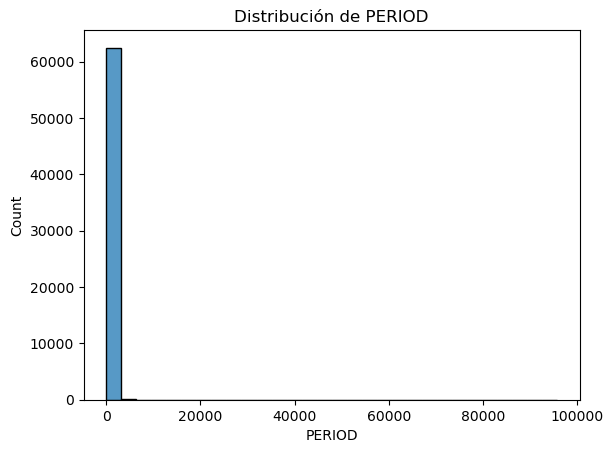

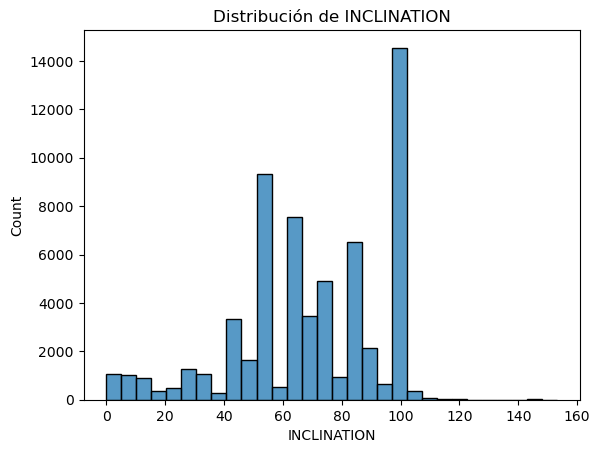

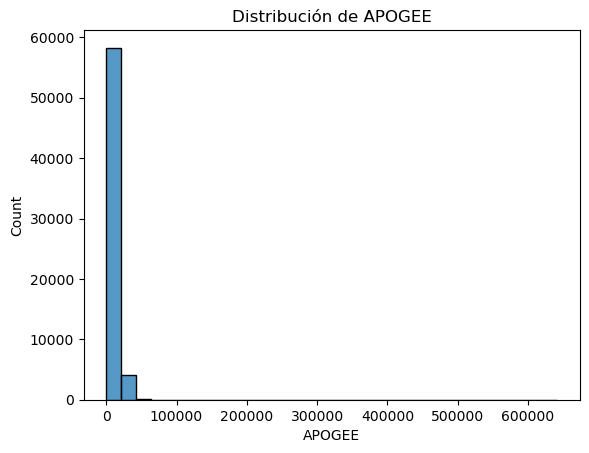

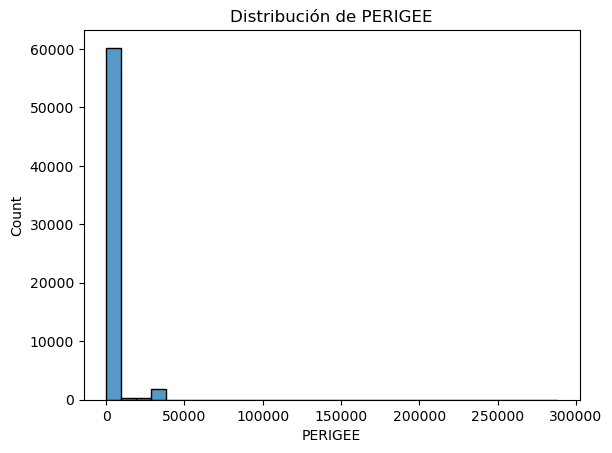

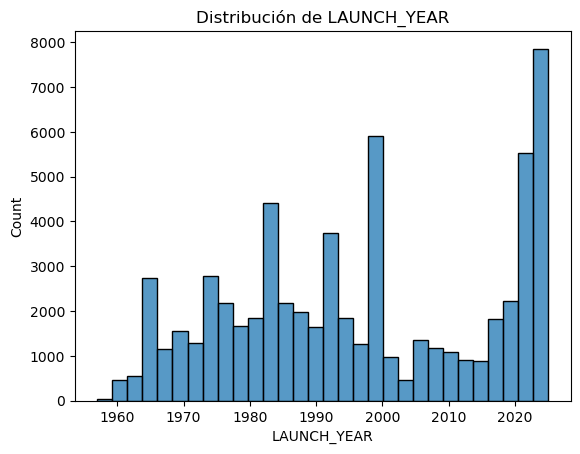

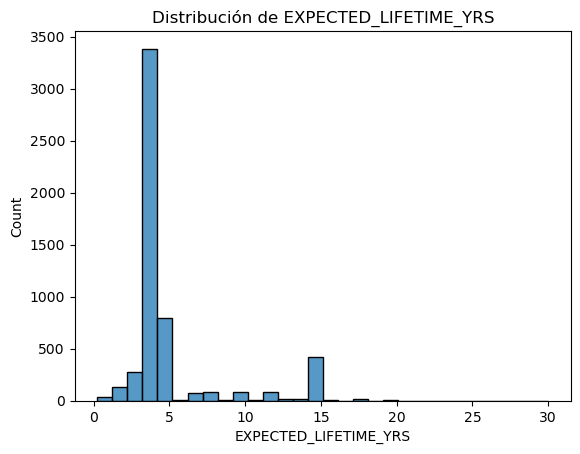

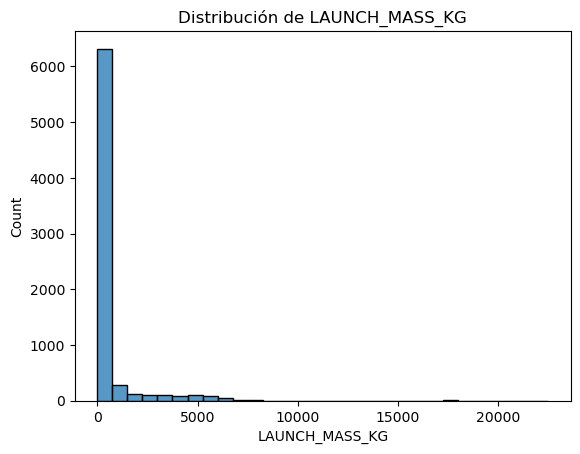

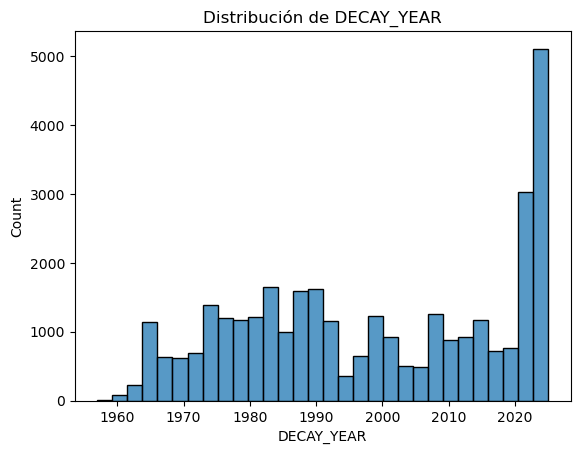

In [23]:
# Veamos la distribución de las columnas numéricas relevantes
for col in numeric_cols:
    sns.histplot(clean_df[col].dropna(), bins=30)
    plt.title(f'Distribución de {col}')
    plt.show()

Notemos que hay varias variables que parecen tener muchos outliers. La que más llama la atención es 'PERIOD'. Exploremosla.

In [24]:
clean_df['PERIOD'].describe()

count    62548.000000
mean       178.561298
std        677.556733
min          0.000000
25%         89.260000
50%         94.110000
75%        101.200000
max      95687.680000
Name: PERIOD, dtype: float64

Claramente tiene muchos outliers (el máximo es 3 órdenes de magnitud mayor que la media y el mínimo es 0). Para decidir que otras columnas utilizamos para eliminar los outliers, veamos los valores nulos de cada uno:

In [25]:
clean_df[numeric_cols].isnull().sum()

PERIOD                     973
INCLINATION                973
APOGEE                     973
PERIGEE                    973
LAUNCH_YEAR                  0
EXPECTED_LIFETIME_YRS    58080
LAUNCH_MASS_KG           56215
DECAY_YEAR               30079
dtype: int64

Podemos elimiinar los outliers de todas las columnas con pocos valores faltantes (pues no tiene sentido eliminar outliers si hay pocos datos).

In [26]:
# Podemos eliminar los datos por encima del percentil 99 y debajo del percentil 1

clean_df_filtered = clean_df.copy()

columns_to_filter = ['PERIOD', 'INCLINATION', 'APOGEE', 'PERIGEE', 'LAUNCH_YEAR']
# cambiar las columnas si se quiere

# Armamos una máscara donde guardamos a los valores outliers
outlier_mask = np.full(len(clean_df_filtered), False)
for col in columns_to_filter:
    lower = clean_df_filtered[col].quantile(0.01) # Podemos agrandar este rango si asi lo quieren
    upper = clean_df_filtered[col].quantile(0.99)

    # Identificamos outliers por columna
    is_outlier = (clean_df_filtered[col] < lower) | (clean_df_filtered[col] > upper)

    # Acumulamos una máscara global de outliers
    outlier_mask |= is_outlier

# Filtramos todas las filas que tienen outliers en alguna columna
clean_df_filtered = clean_df_filtered[~outlier_mask]

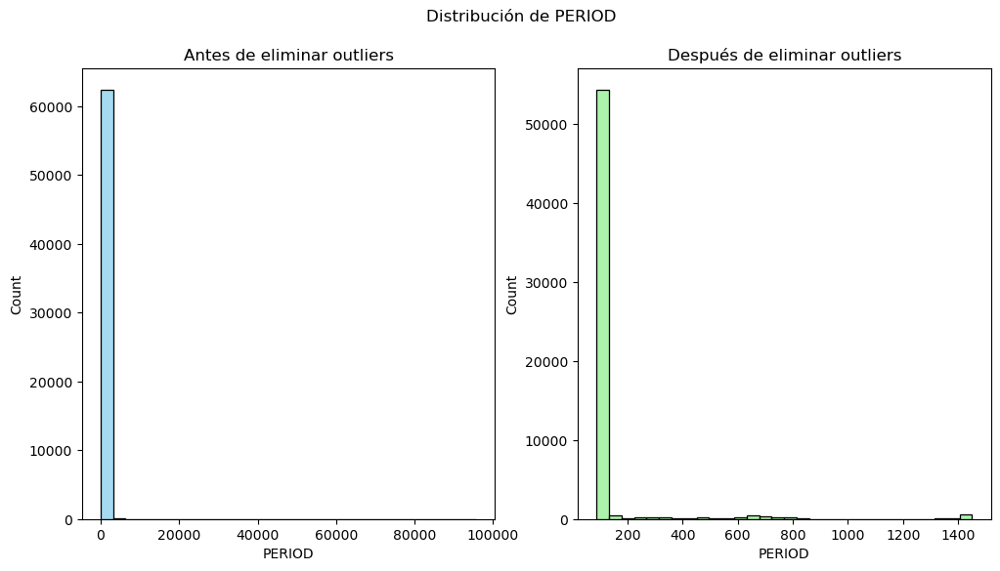

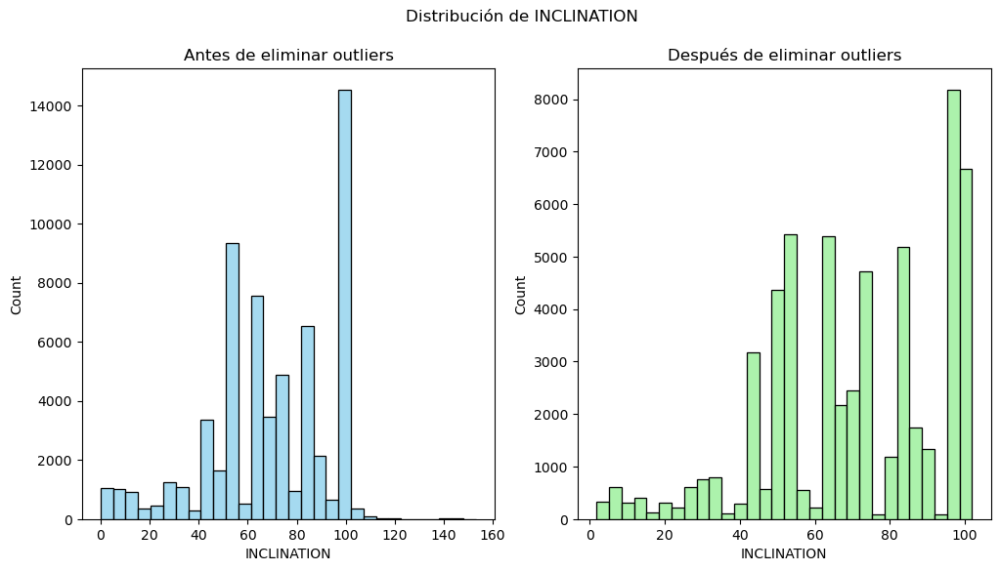

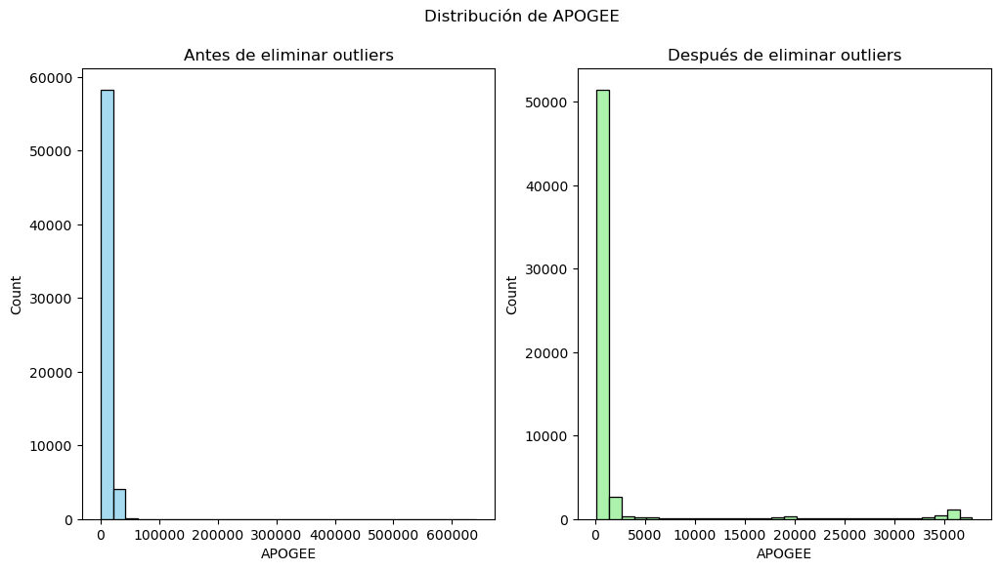

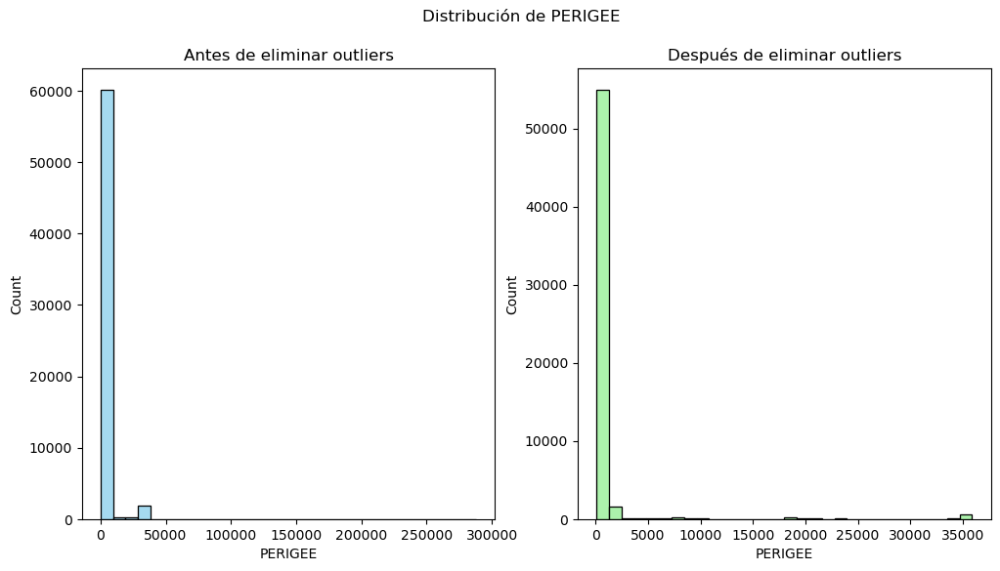

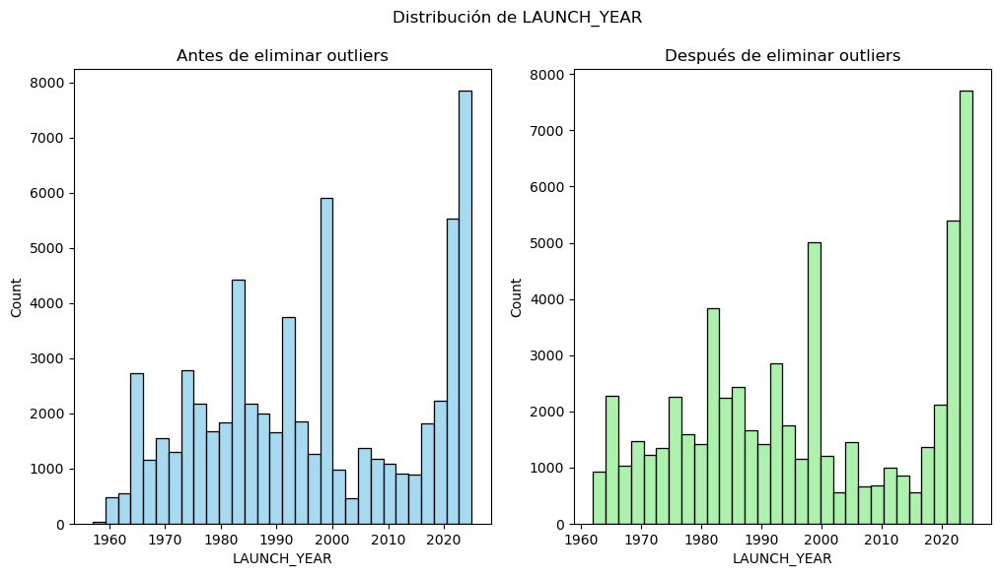

In [27]:
# Veamos la nueva distribución de las columnas numéricas relevantes
for col in columns_to_filter:
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(f'Distribución de {col}')
    # Antes de eliminar outliers
    sns.histplot(clean_df[col].dropna(), bins=30, ax=axes[0], color='skyblue', edgecolor='black')
    axes[0].set_title('Antes de eliminar outliers')
    # Después
    sns.histplot(clean_df_filtered[col].dropna(), bins=30, ax=axes[1], color='lightgreen', edgecolor='black')
    axes[1].set_title('Después de eliminar outliers')
    plt.show()

### Variables categóricas

Veamos todas las variables con datos nulos:

In [28]:
clean_df_filtered.isnull().sum()

COUNTRY                          0
PERIOD                         964
INCLINATION                    964
APOGEE                         964
PERIGEE                        964
RCS_SIZE                         0
LAUNCH_YEAR                      0
CURRENT                          0
CLASS_OF_ORBIT               52355
PURPOSE                          0
EXPECTED_LIFETIME_YRS        54353
COUNTRY_OF_OPERATOR_OWNER        0
LAUNCH_MASS_KG               52559
DECAY_YEAR                   27786
dtype: int64

Podemos comenzar haciendo una imputación manual para 'CLASS_OF_ORBIT'. Para las filas que tienen valores nulos en esta columna podemos asociarle un tipo de órbita a partir de su 'PERIGEE'.

In [29]:
# Definimos una función que define los distintos tipos de órbita
class OrbitType(Enum):
    """
    Rangos en kilómetros para cada tipo de órbita
    """
    BLO = (0, 159)
    LEO = (160, 2_000)
    MEO = (2_001, 34_785)
    GEO = (34_786, 36_786)
    HEO = (36_787, float('inf'))

In [30]:
# Definimos una función que dada el perigeo, me calcule a que orbita pertenece
def classify_orbit(perigee):
    for orbit_type in OrbitType:
        lower, upper = orbit_type.value
        if lower <= perigee <= upper:
            return orbit_type.name
    return None

In [31]:
# Creamos una copia para no pisar el original
df_imputed = clean_df_filtered.copy()

# Solo rellenamos si el tipo de órbita es nulo y tenemos el perigeo disponible
mask = df_imputed['CLASS_OF_ORBIT'].isna() & df_imputed['PERIGEE'].notna()

# Aplicamos la función
df_imputed.loc[mask, 'CLASS_OF_ORBIT'] = df_imputed.loc[mask, 'PERIGEE'].apply(classify_orbit)

Veamos los valores faltantes ahora:

In [32]:
df_imputed.isnull().sum()

COUNTRY                          0
PERIOD                         964
INCLINATION                    964
APOGEE                         964
PERIGEE                        964
RCS_SIZE                         0
LAUNCH_YEAR                      0
CURRENT                          0
CLASS_OF_ORBIT                 921
PURPOSE                          0
EXPECTED_LIFETIME_YRS        54353
COUNTRY_OF_OPERATOR_OWNER        0
LAUNCH_MASS_KG               52559
DECAY_YEAR                   27786
dtype: int64

A los 921 valores faltantes dentro de ´CLASS_OF_ORBIT´ los podemos llamar UNKNOWN. Luego, podemos hacer un OrdinalEncoder sobre esta variable para obtener una columna solo con valores numéricos:

In [33]:
df_imputed['CLASS_OF_ORBIT'] = df_imputed['CLASS_OF_ORBIT'].fillna('UNKNOWN')

Veamos si las columnas están bien llamadas:

In [34]:
df_imputed['CLASS_OF_ORBIT'].unique()

array(['BLO', 'LEO', 'UNKNOWN', 'GEO', 'Elliptical', 'MEO', 'LEo'],
      dtype=object)

Veamos cuantos datos con 'Elliptical' hay:

In [35]:
df_imputed[df_imputed['CLASS_OF_ORBIT']=='Elliptical'].describe()

,PERIOD,INCLINATION,APOGEE,PERIGEE,LAUNCH_YEAR,EXPECTED_LIFETIME_YRS,LAUNCH_MASS_KG,DECAY_YEAR
count,25.000000,25.000000,25.000000,25.000000,25.000000,10.000000,23.000000,5.0
mean,438.472800,47.263600,18054.240000,4945.080000,2012.280000,9.500000,1435.417391,2021.6
std,312.252055,28.195782,14662.331361,8577.097547,7.945229,5.317685,1935.752024,0.894427
min,88.180000,1.900000,197.000000,169.000000,1996.000000,1.000000,5.000000,2021.0
25%,94.520000,28.500000,507.000000,276.000000,2009.000000,8.000000,117.000000,2021.0
50%,420.060000,49.350000,24191.000000,472.000000,2014.000000,10.000000,666.000000,2021.0
75%,717.830000,63.330000,27520.000000,2899.000000,2019.000000,14.250000,2250.000000,2022.0
max,912.100000,97.470000,37785.000000,24767.000000,2021.000000,15.000000,8000.000000,2023.0


Como son solo 25, podemos agruparlos dentro de UNKNOWN. Además, pasamos a mayusculas todas las entradas para que no esté el problema de 'LEo':

In [36]:
# Pasar a mayúsculas todas las entradas
df_imputed['CLASS_OF_ORBIT'] = df_imputed['CLASS_OF_ORBIT'].str.upper()

# Reemplazar ELLIPTICAL por UNKNOWN
df_imputed['CLASS_OF_ORBIT'] = df_imputed['CLASS_OF_ORBIT'].replace('ELLIPTICAL', 'UNKNOWN')


Ahora sí, hacemos el encoder ordinal:

In [38]:
from sklearn.preprocessing import OrdinalEncoder

# Creamos el codificador indicandole el orden de la variables
class_order = ['BLO', 'LEO', 'MEO', 'GEO', 'HEO', 'UNKNOWN']
encoder = OrdinalEncoder(categories=[class_order])

# Ajustamos el codificador con la variable education y la transformamos
# (la guardamos en la misma columna)
df_imputed[['CLASS_OF_ORBIT']] = encoder.fit_transform(df_imputed[['CLASS_OF_ORBIT']])
df_imputed.sample(5)

Ahora, todas las variables categ{oricas quedaron sin valores faltantes. Podemos hacer encoding en todas ellas.

In [44]:
df_imputed.isnull().sum()

COUNTRY                          0
PERIOD                         964
INCLINATION                    964
APOGEE                         964
PERIGEE                        964
RCS_SIZE                         0
LAUNCH_YEAR                      0
CURRENT                          0
CLASS_OF_ORBIT                   0
PURPOSE                          0
EXPECTED_LIFETIME_YRS        54353
COUNTRY_OF_OPERATOR_OWNER        0
LAUNCH_MASS_KG               52559
DECAY_YEAR                   27786
dtype: int64

### Encoding

### Escaleo de datos

## Análisis y Visualización de los datos

Para comenzar con el análisis y la visualización empezaremos por hacer una exploración del dataset. Lo primero en lo que nos centraremos es en dividir los objetos por tipo de órbita y hacer una cuantificación de cuántos tipos de objeto tenemos.

Lo cual responde a dos preguntas:

- ¿Cuántos objetos tenemos por órbita?
- ¿Cuántos objetos tenemos de cada tipo?

Para ello comenzaremos definiendo el rango de orbitas en kilómetros mediante el enumerado `OrbitType`. Se hace la salvedad de que para el tipo GEO no se usa el valor exacto (35,786 km) que sale de su [definición](https://es.wikipedia.org/wiki/%C3%93rbita_geoestacionaria) sino un rango centrado en este (± 1000 km) ya que no hay registros que contengan perigeos y/o apogeos con dicho valor.


In [ ]:
class OrbitType(Enum):
    """
    Rangos en kilómetros para cada tipo de órbita
    """
    BLO = (0, 159)  # Órbita terrestre sub-baja (below low orbit)
    LEO = (160, 2_000)  # Órbita terrestre baja (low earth orbit)
    MEO = (2_001, 34_785)  # Órbita terrestre media (medium earth orbit)
    GEO = (34_786, 36_786)  # Órbita geostacionaria (geosynchronous equatorial orbit)
    HEO = (36_787, float('inf'))  # Órbita terrestre alta (high earth orbit)

In [ ]:
def get_orbit_df(dataframe: DataFrame, orbit_type: OrbitType, decayed: bool | None = None) -> DataFrame:
    """
    Retorna el dataframe de la órbita especificada. Por el momento se usa el Perigeo para
    determinar el tipo de órbita. Por defecto se incluyen todos los objetos (decaidos o no)
    """
    return dataframe[
        (dataframe.PERIGEE >= orbit_type.value[0]) &
        (dataframe.PERIGEE <= orbit_type.value[1]) &
        (True if decayed is None else (dataframe.DECAY.notnull() if decayed else dataframe.DECAY.isnull()))
    ]


def plot_pie(data, labels: Sequence[str], title: str | None = None) -> None:
    """
    Función simple para crear un gráfico de torta
    """
    plt.rcParams["figure.figsize"] = (8, 6)
    _, ax = plt.subplots()
    ax.pie(data, labels=labels, autopct='%1.1f%%', textprops={'size': 'smaller'}, radius=1)
    if title is not None:
        plt.title(title)
    plt.show()


def plot_ranking(xseries: Series, yseries: Series, xlabel: str, ylabel: str, title: str | None = None) -> None:
    """
    Función simple para crear un ránking. La serie de valores de Y debe estar ordenada ascendentemente
    """
    plt.figure(figsize=(10, 8))
    bh = plt.barh(yseries, xseries)
    plt.bar_label(bh, fmt=" {}")
    plt.ticklabel_format(style='plain', axis='x')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xlim((0, max(xseries) * 1.25))  # 1.25 genera espacio para las etiquetas de cada barra
    if title is not None:
        plt.title(title)
    plt.show()


# Dataframes por órbita. Ej:
#   {
#     'BLO', get_orbit_df(space_objects_df, OrbitType.BLO),
#     'LEO', get_orbit_df(space_objects_df, OrbitType.LEO),
#     ...
#   }
orbit_df_dic = {
    orbitType.name: get_orbit_df(space_objects_df, orbitType) for orbitType in OrbitType
}

### Ocupación de las órbitas

Veamos ahora como se distribuyen los objetos en cada tipo de órbita:

In [ ]:
plot_pie(
    data=[len(orbit_df) for orbit_df in orbit_df_dic.values()],
    labels=orbit_df_dic.keys(),
    title="Ocupación de las órbitas")

Es muy claro que la mayoría de los objetos están en la órbita baja (LEO) debido seguramente al uso de la misma por constelaciones satelitales de Internet de banda ancha tales como Starlink y Qianfan. Otra posibilidad, que analizaremos en la sección **Distribución de los tipos de objeto**, es el "uso" de esta órbita por la basura espacial.

Con respecto a la órbita BLO, la misma contiene objetos que se pueden considerar en condición de hacer su reentrada en la atmósfera. Veamos cuánto de ese porcentaje está actualmente en órbita:


In [ ]:
blo_df = orbit_df_dic["BLO"]

blo_total = len(blo_df)
blo_decayed = len(blo_df[blo_df.DECAY.notnull()])

print("Total de objetos en órbita BLO:", blo_total)
print("Total de objetos en órbita BLO ya reentrados:", blo_decayed)

Como podemos ver, la mayoría de los objetos en órbita sub-baja BLO ya han hecho su reentrada en la atmósfera terrestre.

### Distribución de los tipos de objeto

Visto el gráfico anterior intentaremos responder la pregunta de qué tipos de objetos tenemos en órbita.

In [ ]:
type_dfs = [satellites_df, debris_df, rockets_df, unknown_df]
type_labels = ["Satélites", "Basura", "Cohetes", "Desconocido"]

plot_pie(
    data=[len(df) for df in type_dfs],
    labels=type_labels,
    title="Tipos de objetos en órbita")

De la anterior visualización podemos concluir que más de la mitad de los objetos que se encuentran en órbita pertenecen a basura espacial, lo cual muestra un conjunto interesante de objetos que podremos analizar más adelante.


### Relación entre tamaño de objeto y tipo de órbita

Veamos ahora como se distribuyen los objetos según su tamaño (pequeño, mediano, grande) sobre los distintos tipos de órbita.

In [ ]:
def get_rcs_size_distribution(df):
    """
    Retorna la distribución de RCS_SIZE para cada tipo de órbita
    """
    return df['RCS_SIZE'].value_counts().sort_index()

# Obtenemos RCS_Size para cada dataframe de orbitaas
rcs_size_dic = {
    orbit_name: get_rcs_size_distribution(orbit_df) for orbit_name, orbit_df in orbit_df_dic.items()
}

# Los combinamos para el grafico
rcs_orbit_heatmap_data = pd.DataFrame(rcs_size_dic).fillna(0)

# Graficamos
plt.figure(figsize=(10, 6))
sns.heatmap(rcs_orbit_heatmap_data, annot=True, fmt='g') # mapa de calor
plt.title('Correlación entre tamaño estimado y tipo de órbita')
plt.xlabel('Tipo de órbita')
plt.ylabel('Tamaño estimado')
plt.xticks(rotation=30)
plt.yticks(rotation=0)
sns.despine()
plt.tight_layout()
plt.show()

Observamos que, en todos los casos excepto para órbitas LEO, en cada órbita abundan los objetos grandes. Sin embargo, en los objetos con órbitas LEO (que recordemos que hay más objetos en órbita baja que en el resto) suelen ser pequeños.

### Análisis sobre la Basura Espacial (_Debris_)

Anteriormente agrupamos los objetos según el tipo de órbita, esto nos dio un muestreo general de los datos, mostrándonos como se distribuyen alrededor de la tierra, esto nos arrojó un dato muy interesante, la mayor cantidad de los objetos que actualmente se encuentran en órbita son basura y restos espaciales. En esta sección nos vamos a centrar principalmente en estos objetos.
La primera pregunta que se puede hacer en base a esto es, **¿cuáles son los países que más basura generan?**

Para ello comenzaremos haciendo una exploracion de los datos, mostrando un ranking de cuales son los países que más basura producen

In [ ]:
# Filtramos solo los objetos que son desechos espaciales
# Nota de optimización: También se podría haber usado directamente 'debris_df'
debris_only_df = space_objects_df[space_objects_df['OBJECT_TYPE'] == 'DEBRIS']

# Agrupamos por país y contamos la cantidad de desechos por país
debris_per_country_df = debris_only_df.groupby('COUNTRY').size().sort_values(ascending=False)
sorted_debris_per_country = debris_per_country_df.sort_values()

plot_ranking(
    xseries=sorted_debris_per_country.values,
    yseries=sorted_debris_per_country.index,
    xlabel="Cantidad de basura",
    ylabel="País",
    title="Cantidad de basura en órbita por país")

Como podemos ver los países que producen mayor cantidad de basura espacial son:
- Rusia (o ex Union Sovietica) - CIS
- Estados Unidos - US
- China - PRC
- Francia - FR

(Siendo los primeros tres los más dominantes)

Si bien estos son numeros "en crudo" nos sirven para hacer un análisis más profundo de los datos y empezar a generar nuevas preguntas, como por ejemplo **¿quién generó mayor cantidad de basura espacial por década?**


In [ ]:
# Filtrar basura espacial y países de interés
selected_countries = ['CIS', 'US', 'PRC']
debris_filtered_df = debris_only_df[debris_only_df['COUNTRY'].isin(selected_countries)].copy()

# Asegurar tipo numérico en LAUNCH_YEAR
debris_filtered_df['LAUNCH_YEAR'] = pd.to_numeric(debris_filtered_df['LAUNCH_YEAR'], errors='coerce')

# Crear columna de década
debris_filtered_df['DECADE'] = (debris_filtered_df['LAUNCH_YEAR'] // 10) * 10

# Agrupar y pivotear: filas = década, columnas = país, valores = cantidad
debris_by_decade_df = (
    debris_filtered_df
    .groupby(['DECADE', 'COUNTRY'])
    .size()
    .reset_index(name='count')
    .pivot(index='DECADE', columns='COUNTRY', values='count')
    .fillna(0)
    .astype(int)
)

colors = {
    'CIS': '#1f77b4',
    'US': '#ff7f0e',
    'PRC': '#2ca02c'
}

ax = debris_by_decade_df.plot(
    kind='bar',
    stacked=True,
    color=[colors[c] for c in debris_by_decade_df.columns],
    figsize=(10, 6)
)

# Agregar etiquetas de valor por país en cada segmento
for i, decade in enumerate(debris_by_decade_df.index):
    y_offset = 0
    for country in debris_by_decade_df.columns:
        value = debris_by_decade_df.loc[decade, country]
        if value > 0:
            ax.text(
                i, y_offset + value / 2,  # posición del texto
                str(value),
                ha='center', va='center',
                fontsize=8, color='white', fontweight='bold'
            )
            y_offset += value

plt.title('Basura espacial por década y país')
plt.xlabel('Década')
plt.ylabel('Cantidad de objetos DEBRIS')
plt.legend(title='País')
plt.tight_layout()
plt.show()

Del anterior gráfico podemos analizar lo siguiente:

- En los 80 la Unión Soviética generó casi el 90% de la basura espacial total, dismiuyendo considerablemente en las décadas siguientes (sobretodo después del 90 por el fin de la Unión Soviética). Esto nos da a entender que previo a ese punto crucial, el país invirtió mucho capital en materia aeroespacial.
- Estados Unidos se mantuvo consistente en la generacion de basura, disminuyendo la cantidad en la década después del 2000, esto se debe a implementacion de [programas para reducir la basura espacial](https://orbitaldebris.jsc.nasa.gov/).
- China fue el país que más basura generó en los 90, y el que actualmente más basura está generando, esto se debe principalmente a que a finales de la década del 90 China fue el país que más se desarrolló en materia aeroespacial.
- Otro análisis interesante que podemos hacer es que después de la guerra fria (post década de los 90) la basura espacial ha disminuido drásticamente, esto se debe a condiciones económicas y sociales de cada país. También en la inversión que se ha hecho en las últimas décadas para disminuir la basura generada en el espacio.

### Distribuciones de basura por país y tamaño

Visto el análisis anterior otro parametro interesante para evaluar es el tamaño de basura espacial y cuál es la distribucion de basura por tamaño y por país (de los que están en el top anteriormente analizado)

In [ ]:
# Seleccionamos sólo los países deseados
selected_countries = ['CIS', 'US', 'PRC']
top_debris_countries_df = debris_only_df[debris_only_df['COUNTRY'].isin(selected_countries)].copy()

# Mapeamos tamaños a valores numéricos ordenados
rcs_order = ['SMALL', 'MEDIUM', 'LARGE']
rcs_map = {name: i for i, name in enumerate(rcs_order)}
top_debris_countries_df['RCS_NUMERIC'] = top_debris_countries_df['RCS_SIZE'].map(rcs_map)

# Filtramos solo filas con valor mapeado válido
top_debris_countries_df = top_debris_countries_df[top_debris_countries_df['RCS_NUMERIC'].notna()]

# Configuramos estilo bonito
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Creamos el violinplot con colores personalizados
palette = {
    'CIS': '#1f77b4',
    'US': '#ff7f0e',
    'PRC': '#2ca02c'
}

sns.violinplot(
    data=top_debris_countries_df,
    x='COUNTRY',
    y='RCS_NUMERIC',
    palette=palette,
    order=selected_countries,
    inner='quartile',
    cut=0,
    linewidth=1.2
)

# Convertimos valores numéricos en labels de texto
plt.yticks(
    ticks=[rcs_map[name] for name in rcs_order if name in top_debris_countries_df['RCS_SIZE'].unique()],
    labels=[name.capitalize() for name in rcs_order if name in top_debris_countries_df['RCS_SIZE'].unique()]
)

# Títulos y etiquetas
plt.title('Distribución del tamaño de la basura espacial por país', fontsize=14)
plt.xlabel('País')
plt.ylabel('Tamaño estimado (RCS_SIZE)')
plt.tight_layout()
plt.show()

# Tabla de frecuencias cruzadas
size_distribution = (
    top_debris_countries_df.groupby(['COUNTRY', 'RCS_SIZE'])
    .size()
    .unstack(fill_value=0)
    .reindex(index=selected_countries, columns=rcs_order, fill_value=0)
)

# Calcular porcentajes por fila
percentage_distribution = size_distribution.div(size_distribution.sum(axis=1), axis=0) * 100

# Redondear a 1 decimal
percentage_distribution = percentage_distribution.round(1)

print("\nDistribución de basura espacial por país y tamaño (RCS_SIZE):")
display(size_distribution)

print("\nDistribución de basura espacial por país y tamaño (RCS_SIZE)\n(porcentajes respecto del total de cada país:")
display(percentage_distribution)

Los anteriores gráficos nos muestran que existe una fuerte correlación entre la cantidad de basura y el tamaño de la misma, también arroja otros datos interesantes como:

- Si nos enfocamos en China, podemos ver que este país tiene una gran porcentaje de basura pequeña con respecto a los otros tipos de basura.
- Rusia es el país que genera basura de mayor tamaño (categorías _MEDIUM_ Y _LARGE_)

Para ver esto con un poco más de claridad, lo podemos visualizar en el siguiente gráfico de correlación:

In [ ]:
heatmap_data = (
  top_debris_countries_df.groupby(['COUNTRY', 'RCS_SIZE'])
    .size()
    .unstack(fill_value=0)
    .reindex(index=selected_countries, columns=rcs_order, fill_value=0)
)
heatmap_percent = heatmap_data.div(heatmap_data.sum(axis=1), axis=0) * 100

# Crear heatmap porcentual
plt.figure(figsize=(8, 5))
sns.heatmap(
    heatmap_percent.round(1),
    annot=True, fmt=".1f", cmap="OrRd",
    cbar_kws={'label': '% sobre total del país'}
)

plt.title("Distribución porcentual de basura espacial por país y tamaño")
plt.xlabel("Tamaño estimado")
plt.ylabel("País")
plt.tight_layout()
plt.show()

### Distribucion de basura por órbita

Luego de analizar la cantidad de basura que genera cada país, observaremos la distribución de basura por órbita en base al APOGEO. Para ello graficaremos un histograma.

In [ ]:
# Convertir APOGEE a numérico
top_debris_countries_df['APOGEE'] = pd.to_numeric(top_debris_countries_df['APOGEE'], errors='coerce')
apogee_data = top_debris_countries_df['APOGEE'].dropna()
apogee_data = apogee_data[apogee_data < 40000]  # Filtramos valores extremos

plt.figure(figsize=(10, 6))
sns.histplot(apogee_data, bins=100, color='darkblue', kde=True)
plt.title('Distribución de basura por órbita')
plt.xlabel('Apogeo (km)')
plt.ylabel('Cantidad de objetos')
plt.axvline(2000, color='orange', linestyle='--', label='Fin de LEO (~2000 km)')
plt.axvline(35800, color='red', linestyle='--', label='Órbita GEO (~35800 km)')
plt.legend()
plt.tight_layout()
plt.show()

La mayoría de la basura espacial se encuentra distribuida en la órbita LEO, esto sucede ya que esta región es intensamente utilizada para satélites de comunicaciones, observación terrestre y operaciones militares. También los objetos lanzados en estas órbitas son los que menos duración tienen.

Relacionándolo con los análisis anteriores también podemos determinar que la mayoría de esta basura fue generada durante la década de los 80/90 ya que durante la guerra fría la Unión Soviética realizaba experimentos sobre estas órbitas.


### Ránking de objetos en órbita por país

In [ ]:
objs_per_country_df = space_objects_df \
    .groupby("COUNTRY") \
    .count() \
    .sort_values("OBJECT_ID", ascending=False) \
    .head(n=30) \
    .sort_values("OBJECT_ID", ascending=True)

plot_ranking(
    xseries=objs_per_country_df.OBJECT_ID,
    yseries=objs_per_country_df.index,
    xlabel="Cantidad de objetos (satélites, restos, etc.)",
    ylabel="País",
    title="Cantidad de objetos en órbita por país")

### Correlación entre tamaño estimado y tipo de objeto


Podemos, también, estudiar si existe relación entre el tamaño y tipo de objeto.

In [ ]:
# Creamos la tabla cruzada
obj_size_vs_type_df = pd.crosstab(space_objects_df['RCS_SIZE'], space_objects_df['OBJECT_TYPE'])

# Graficamos
plt.figure(figsize=(10, 6))
sns.heatmap(obj_size_vs_type_df, annot=True, fmt='g') # mapa de calor
plt.title('Correlación entre tamaño estimado y tipo de objeto')
plt.xlabel('Tipo de objeto')
plt.ylabel('Tamaño estimado')
plt.xticks(rotation=30)
plt.yticks(rotation=0)
sns.despine()
plt.tight_layout()
plt.show()

Notemos que la basura espacial suele tener tamaño pequeño. Por otro lado, tanto los satélites como los cohetes son generalmente grandes. Para los objetos no reconocidos, no podemos encontrar una relación tan directa como en el resto, ya que se ven de todos los tamaños.

### Objetos activos en órbita

En los análisis anteriores nos enfocamos principalmente en la población total de objetos espaciales, donde observamos que la basura espacial representa la mayoría (aproximadamente un 56%). A continuación, exploraremos cómo varían las distribuciones al excluir los objetos clasificados como basura espacial. Siguiendo la misma línea, realizaremos el análisis por país, comenzando con la pregunta:

**¿Cuáles son los países con mayor cantidad de objetos activos en órbita?**


In [ ]:
objs_per_country_no_debris_df = space_objects_df[space_objects_df['OBJECT_TYPE'] != 'DEBRIS'] \
    .groupby("COUNTRY") \
    .count() \
    .sort_values("OBJECT_ID", ascending=False) \
    .head(n=30) \
    .sort_values("OBJECT_ID", ascending=True)

plot_ranking(
    xseries=objs_per_country_no_debris_df.OBJECT_ID,
    yseries=objs_per_country_no_debris_df.index,
    xlabel="Cantidad de objetos activos en orbita",
    ylabel="País",
    title="Cantidad de objetos en órbita por país")

Observando el gráfico anterior, podemos ver que esta vez el país con la mayor cantidad de objetos activos en órbita es Estados Unidos, lo que indica que la mayoría de los objetos asociados a Rusia pertenecen a la categoría de basura espacial. China se mantiene en el tercer lugar, reflejando que la mayoría de sus lanzamientos corresponden a décadas más recientes.

En el siguiente gráfico, analizaremos a qué categorías pertenecen los objetos activos en órbita para cada país.

In [ ]:
top3_countries = objs_per_country_no_debris_df.tail(3).index.tolist()

grouped_top3_df = (
    space_objects_df[
        (space_objects_df['OBJECT_TYPE'] != 'DEBRIS') &
        (space_objects_df['COUNTRY'].isin(top3_countries))
    ]
    .groupby(['COUNTRY', 'OBJECT_TYPE'])
    .size()
    .reset_index(name='Cantidad')
)

pivot_df = grouped_top3_df.pivot(index='COUNTRY', columns='OBJECT_TYPE', values='Cantidad').fillna(0)

fig, ax = plt.subplots(figsize=(10, 6))

colors = plt.get_cmap('Set2').colors

bottom = [0] * len(pivot_df)
for i, column in enumerate(pivot_df.columns):
    values = pivot_df[column].values
    bars = ax.bar(pivot_df.index, values, bottom=bottom, label=column, color=colors[i % len(colors)])

    for j, value in enumerate(values):
        if value > 0:
            ax.text(j, bottom[j] + value / 2, int(value), ha='center', va='center', fontsize=9, color='black')

    bottom = [bottom[k] + values[k] for k in range(len(values))]

ax.set_title('Cantidad de objetos espaciales NO-DEBRIS por tipo')
ax.set_xlabel('País')
ax.set_ylabel('Cantidad de objetos')
ax.legend(title='Tipo de objeto', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Del gráfico anterior se pueden extraer varias observaciones interesantes:

- La mayoría de los objetos activos en Estados Unidos son del tipo PAYLOAD, es decir, satélites comerciales, militares, científicos, entre otros. Esta gran cantidad se explica en gran medida por las constelaciones de satélites de telecomunicaciones, como por ejemplo Starlink.

- En Rusia, la mayoría de los objetos activos corresponden al tipo ROCKET BODY, que aunque son considerados “activos” en el registro, en realidad no cumplen una función específica, sino que son etapas de cohetes que quedaron en órbita después de desplegar sus cargas útiles. En definitiva es potencial basura espacial.

- China, en cambio, presenta la mayor cantidad de objetos clasificados como UNKNOWN (si se compara con los otros países), que básicamente son objetos cuya misión o propósito no ha sido identificado o declarado públicamente, lo que dificulta su seguimiento y clasificación precisa.

### Análisis de lanzamientos por año

Finalmente podemos hacer un análisis a partir de los años para poder visualizar de mejor manera como fue la historia de los lanzamientos espaciales.

Para esto, comenzamos haciendo un gráfico general de cantidad de lanzamientos por año.

In [ ]:
space_objects_df['LAUNCH_YEAR'].value_counts().sort_index().plot(figsize=(10,5))
plt.title("Lanzamientos por año")
plt.xlabel("Año")
plt.ylabel("Cantidad de objetos lanzados")

Podemos observar que a partir de la década de 1960 comienza un aumento significativo en la cantidad de lanzamientos de objetos espaciales, alcanzando un primer pico alrededor de 1965. Este crecimiento coincide con el contexto de la Guerra Fría, durante el cual la carrera espacial entre Estados Unidos y la Unión Soviética impulsó fuertemente las actividades espaciales.

Posteriormente, se observan algunos picos notables en años particulares: alrededor de 1982, 1995, cerca del año 2000 y especialmente en la actualidad.

Podemos realizar el mismo gráfico pero separando por tipo de objeto.

In [ ]:
# Agrupar por año y tipo de objeto
launches_by_year_and_type_df = (
    space_objects_df.groupby(['LAUNCH_YEAR', 'OBJECT_TYPE'])
    .size()
    .reset_index(name='count')
)

# Gráfico de líneas
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=launches_by_year_and_type_df,
    x='LAUNCH_YEAR',
    y='count',
    hue='OBJECT_TYPE',
    marker='o'
)

plt.title("Cantidad de objetos lanzados por año, por tipo")
plt.xlabel("Año")
plt.ylabel("Cantidad de objetos")
plt.legend(title='Tipo de objeto')
plt.tight_layout()
plt.show()

En este notamos que casi todo lo que fue lanzado en el pasado corresponde a basura espacial hoy en día. En lo que corresponde a satélites, notemos que existe un gran pico en la actualidad. Este puede asociarse a la explosión de lanzamientos comerciales, especialmente por parte de empresas privadas como SpaceX y megaconstelaciones como Starlink.

Podemos centrarnos en ver únicamente la evolución temporal de objetos lanzados por los 2 países que más objetos lanzan: US y CIS.

In [ ]:
# Filtramos sólo CIS y US
cis_and_us_df = space_objects_df[space_objects_df['COUNTRY'].isin(['CIS', 'US'])]

# Vemos también únicamente satelites
satellites_only_df = space_objects_df[space_objects_df['OBJECT_TYPE'] == 'PAYLOAD']
cis_and_us_satellites_df = satellites_only_df[satellites_only_df['COUNTRY'].isin(['CIS', 'US'])]

# Agrupamos ambos por año y país
total_launches_by_year_country_df = (
    cis_and_us_df.groupby(['LAUNCH_YEAR', 'COUNTRY'])
    .size()
    .reset_index(name='count')
    .sort_values('LAUNCH_YEAR')
)
satellites_launches_by_year_country_df = (
    cis_and_us_satellites_df.groupby(['LAUNCH_YEAR', 'COUNTRY'])
    .size()
    .reset_index(name='count')
    .sort_values('LAUNCH_YEAR')
)

# Graficamos
fig, axes = plt.subplots(ncols=2,nrows=1, figsize=(12,6))
plt.suptitle('Cantidad de objetos lanzados por año (CIS vs US)')
sns.lineplot(
    data=total_launches_by_year_country_df,
    x='LAUNCH_YEAR',
    y='count',
    hue='COUNTRY',
    marker='o',
    ax=axes[0]
)

sns.lineplot(
    data=satellites_launches_by_year_country_df,
    x='LAUNCH_YEAR',
    y='count',
    hue='COUNTRY',
    marker='o',
    ax=axes[1]
)

axes[0].set_title("Totales")
axes[1].set_title("Satélites")

axes[0].set_ylabel("Cantidad de lanzamientos")
axes[1].set_ylabel("Cantidad de lanzamientos")

axes[0].set_xlabel("Año")
axes[1].set_xlabel("Año")

plt.tight_layout(rect=[0, 0, 1, 0.95], w_pad=4)
plt.show()

Podemos ver que el país con mayor cantidad de objetos lanzados fue variando pero se encuentra un pico muy grande para US en los últimos años, sobretodo si nos centramos únicamente en los satélites (probablemente, como dijimos antes, a las actividades como Starlink). Por otra parte, la CIS tiene un gran pico en las décadas de los 80s/90s pero que en la actualidad son casi todos desechos.

Recordemos que durante la guerra fría existió una carrera espacial entre la URSS y EEUU por la conquista del espacio que fue [desde el 4 de octubre de 1957 al 17 de julio de 1975](https://es.wikipedia.org/wiki/Carrera_espacial). Por lo tanto, podemos restringirnos a ese tiempo para ver cómo fueron la cantidad de objetos lanzados.

In [ ]:
# Aplicamos máscara sobre cada DataFrame
space_race_df = cis_and_us_df[
    (cis_and_us_df['LAUNCH_YEAR'] >= 1957) & (cis_and_us_df['LAUNCH_YEAR'] <= 1975)
]

space_race_satellites_only_df = cis_and_us_satellites_df[
    (cis_and_us_satellites_df['LAUNCH_YEAR'] >= 1957) & (cis_and_us_satellites_df['LAUNCH_YEAR'] <= 1975)
]

# Agrupamos ambos por año y país
total_launches_by_year_country_time = (
    space_race_df.groupby(['LAUNCH_YEAR', 'COUNTRY'])
    .size()
    .reset_index(name='count')
    .sort_values('LAUNCH_YEAR')
)
satellites_launches_by_year_country_time = (
    space_race_satellites_only_df.groupby(['LAUNCH_YEAR', 'COUNTRY'])
    .size()
    .reset_index(name='count')
    .sort_values('LAUNCH_YEAR')
)

# Graficamos
fig, axes = plt.subplots(ncols=2,nrows=1, figsize=(12,6))
plt.suptitle('Cantidad de objetos lanzados por año (CIS vs US)')
sns.lineplot(
    data=total_launches_by_year_country_time,
    x='LAUNCH_YEAR',
    y='count',
    hue='COUNTRY',
    marker='o',
    ax=axes[0]
)

sns.lineplot(
    data=satellites_launches_by_year_country_time,
    x='LAUNCH_YEAR',
    y='count',
    hue='COUNTRY',
    marker='o',
    ax=axes[1]
)

# Agregamos líneas verticales con etiquetas de eventos históricos
for ax in axes:
    ax.axvline(x=1957, color='gray', linestyle='--', alpha=0.7, label='Sputnik')
    ax.axvline(x=1961, color='blue', linestyle='--', alpha=0.6, label='Gagarin')
    ax.axvline(x=1969, color='green', linestyle='--', alpha=0.6, label='Apollo 11')
    ax.axvline(x=1975, color='red', linestyle='--', alpha=0.6, label='Apollo–Soyuz')
    ax.legend()

axes[0].set_title("Totales")
axes[1].set_title("Satélites")

axes[0].set_ylabel("Cantidad de lanzamientos")
axes[1].set_ylabel("Cantidad de lanzamientos")

axes[0].set_xlabel("Año")
axes[1].set_xlabel("Año")

# Agregamos la leyenda unicamente en un grafico
axes[0].legend(loc='upper left')
axes[1].legend().remove()

plt.tight_layout(rect=[0, 0, 1, 0.95], w_pad=4)
plt.show()


En estos gráficos podemos ver como durante estos años, los países competían para ver quien lanzaba mayor cantidad de objetos al espacio. En el gráfico se muestra además líneas verticales con eventos históricos:

- Sputnik 1: lanzado el 4 de octubre de 1957 por la Unión Soviética, fue el primer satélite artificial de la historia.
- Gagarin: Cosmonauta y piloto soviético que se convirtió en el primer hombre en viajar al espacio exterior, logrando un importante hito en la carrera espacial; su cápsula, Vostok 1, completó una órbita de la Tierra el 12 de abril de 1961.
- Apollo 11: Fue la primera vez de la historia en lograr que un ser humano llegó a la Luna. La nave Apolo de la misión fue enviada al espacio, por Estados Unidos, el 16 de julio de 1969, realizó su alunizaje el 20 de julio de ese mismo año.
- Apollo Soyuz: La carrera espacial acabó el 17 de julio de 1975, día en que se acoplaron las naves Apolo CSM-111 (Estados Unidos) y Soyuz 19 (Unión Soviética), marcando el fin de la competencia espacial entre ambas naciones.

En el gráfico que muestra los lanzamientos totales realizados por ambos países, se puede apreciar claramente la competencia entre ambos países en la carrera espacial. Es interesante observar cómo, a lo largo del tiempo, se alternan en el liderazgo en cuanto a cantidad de objetos lanzados. Hacia el final del período de la Guerra Fría, ambos terminan con cifras muy similares, lo que refleja cómo la competencia espacial fue sostenida y equilibrada entre las dos potencias.